In [116]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
import matplotlib.pyplot as plt
import seaborn as sns

house_prices= pd.read_csv("housing_prices.csv")

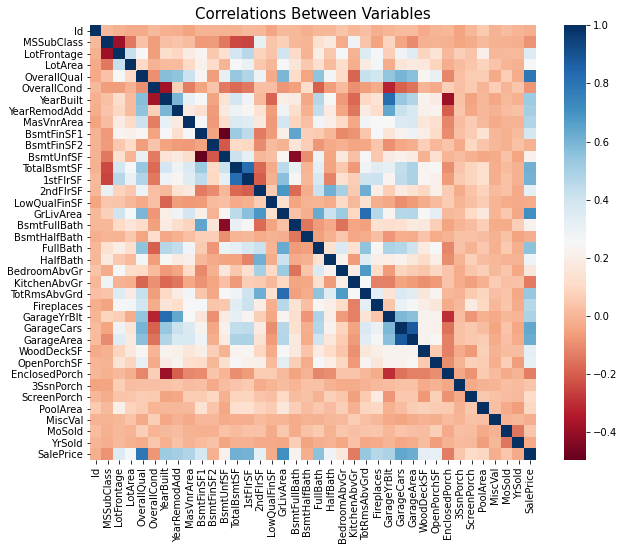

In [2]:
plt.figure(figsize=(10,8))
sns.heatmap(house_prices.corr(), cmap="RdBu")
plt.title("Correlations Between Variables", size=15)
plt.show()

In [4]:
X = house_prices.drop(columns=['SalePrice'])
y = house_prices['SalePrice']

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.8, random_state=8)

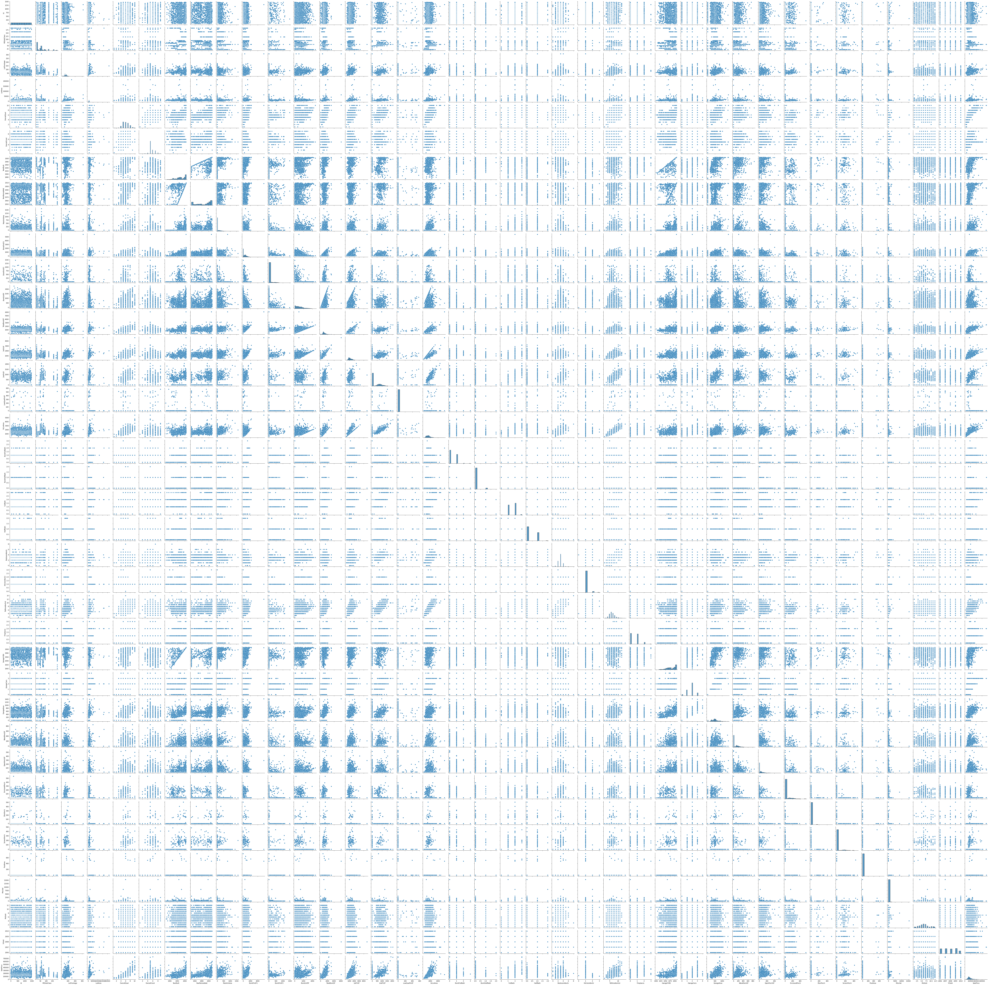

In [7]:
g = sns.PairGrid(house_prices)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

<AxesSubplot:xlabel='GrLivArea', ylabel='SalePrice'>

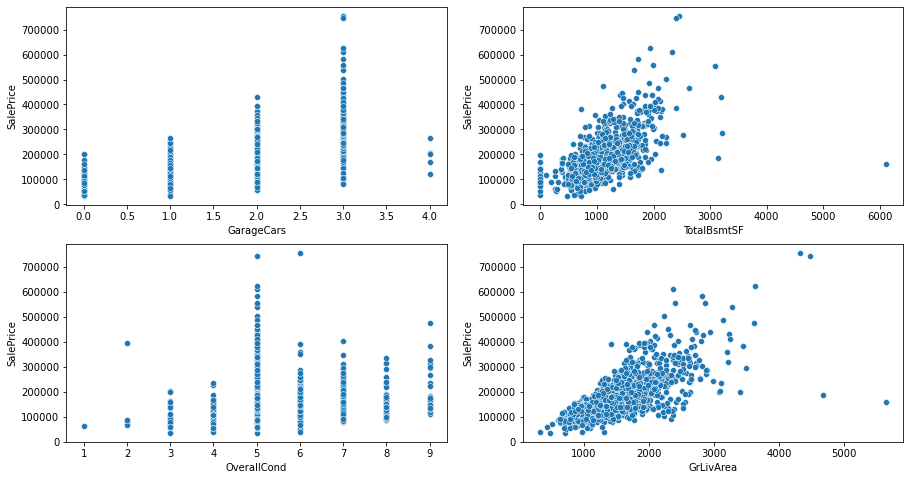

In [10]:
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1)
sns.scatterplot(data=house_prices, x='GarageCars', y=y)
plt.subplot(2, 2, 2)
sns.scatterplot(data=house_prices, x='TotalBsmtSF', y=y)
plt.subplot(2, 2, 3)
sns.scatterplot(data=house_prices, x='OverallCond', y=y)
plt.subplot(2, 2, 4)
sns.scatterplot(data=house_prices, x='GrLivArea', y=y)

Dummy model

In [8]:
X_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [9]:
X_train[['OverallCond','GrLivArea','GarageCars','TotalBsmtSF']]

,OverallCond,GrLivArea,GarageCars,TotalBsmtSF
884,5,892,1,892
641,5,1929,2,1057
1357,6,1078,2,1078
469,5,1710,2,832
222,6,1552,2,713
...,...,...,...,...
986,8,1635,1,485
133,5,1296,2,1267
361,5,1505,1,883
1364,5,1200,2,600


In [18]:
def dummy_model_b(bsmt):
    return bsmt * 35

In [19]:
def dummy_model_l(liv):
    return liv * 123

In [27]:
def dummy_model_c(cars):
    for car in cars:
        if car == 1:
            return 14100
        if car == 2:
            return 19200
        if car == 3:
            return 28200
        if car == 4:
            return 42300
        elif car == 0:
            return 0

In [28]:
x_copy = X_train.copy()

In [32]:
dummy_model_res= (
x_copy
    .assign(
        preds_l = lambda x: dummy_model_l(x['GrLivArea']),
        l_b= lambda x: x['GrLivArea']- x['TotalBsmtSF'],
        preds_b = lambda x: dummy_model_b(x['l_b']),
        preds_c = lambda x: dummy_model_c(x['GarageCars']),
        price = y_train
        )
    .assign(
        error = lambda x:  (x['preds_l'] + x['preds_b']+ x['preds_c'])-x['price'],
        preds_t = lambda x: x['preds_l'] + x['preds_b']+ x['preds_c']
))
dummy_model_res[['preds_t','price','error']].head(10)

,preds_t,price,error
884,123816,100000,23816
641,281887,226000,55887
1357,146694,149900,-3206
469,255160,187000,68160
222,234361,179900,54461
512,120372,129900,-9528
359,280082,280000,82
9,149581,118000,31581
456,204612,98000,106612
616,225117,183200,41917


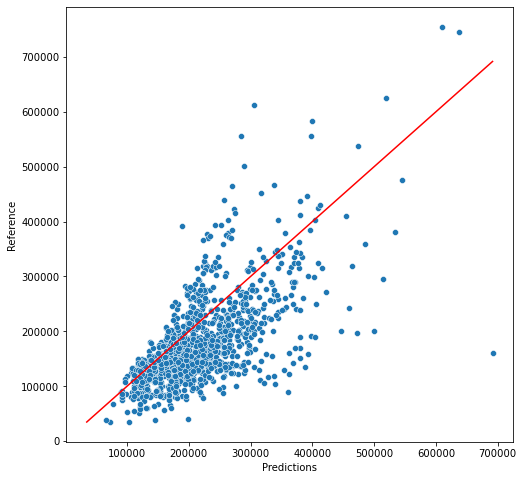

In [37]:
def plot_predictions(y_true, y_pred): 
    max_preds = min([max(y_pred.tolist()), max(y_true.tolist())])
    min_preds = min([min(y_pred.tolist()), min(y_true.tolist())])
    # plot
    plt.figure(figsize=(8,8))
    sns.scatterplot(x=y_pred, y=y_true)
    sns.lineplot(x=[min_preds,max_preds], y=[min_preds, max_preds], color='red')
    plt.ylabel('Reference')
    plt.xlabel('Predictions')
    plt.show()
plot_predictions(dummy_model_res['price'], dummy_model_res['preds_t'])

Linear regression model

In [44]:
from sklearn.linear_model import LinearRegression

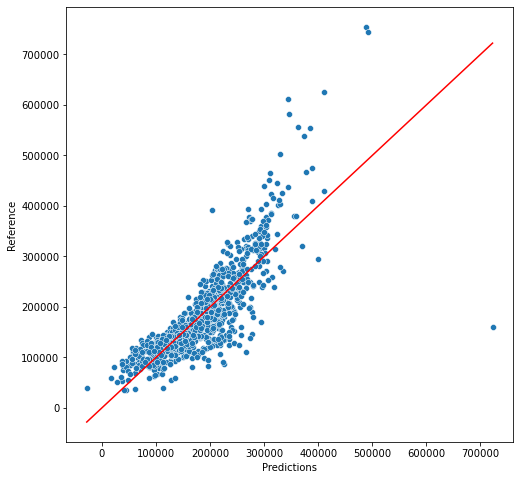

In [47]:
lm = LinearRegression()
lm.fit(np.array(X_train[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond']]), y_train)
plot_predictions(y_train, lm.predict(np.array(X_train[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond']])))

In [48]:
print(lm.coef_, lm.intercept_)

[35371.69064593    68.67017994    49.92958748  5111.87621829] -66369.22737084405


In [53]:
results = pd.DataFrame({
    'predictions':lm.predict(np.array(X_test[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond']])), 
    'true_values':y_test
})
results.head()
plot_predictions(results.true_values, results.predictions)

,predictions,true_values
1260,186946.869488,181000
274,101563.007021,124500
51,156544.086228,114500
117,163358.273365,155000
789,230125.245992,187500


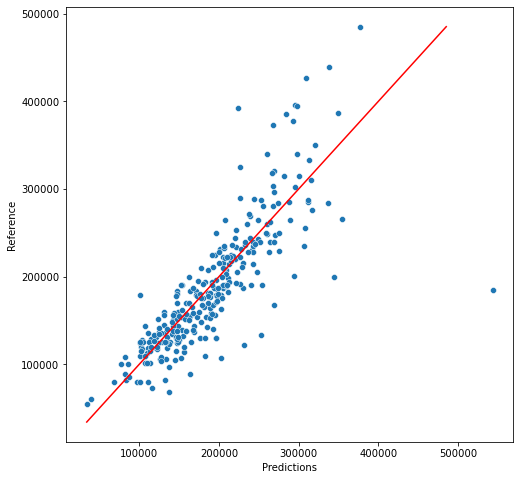

In [54]:
plot_predictions(results.true_values, results.predictions)

Errors

In [55]:
mse_pre = (results
               .assign(diff = lambda x: (x.true_values - x.predictions)**2)
               .agg({'diff':{'sum','count'}}))
mse = mse_pre.loc['sum'] / mse_pre.loc['count']
mse

diff    1.786783e+09
dtype: float64

In [56]:
from sklearn.metrics import mean_squared_error
mean_squared_error(results.true_values, results.predictions)

1786782789.8687227

In [57]:
rmse = (mse_pre.loc['sum'] / mse_pre.loc['count'])**0.5
rmse

diff    42270.353557
dtype: float64

In [58]:
mean_squared_error(results.true_values, results.predictions)**0.5

42270.35355741329

In [59]:
mae_pre = (results
               .assign(diff = lambda x: abs(x.true_values - x.predictions))
               .agg({'diff':{'sum','count'}}))
mae = mae_pre.loc['sum'] / mae_pre.loc['count']
mae

diff    26808.888738
dtype: float64

In [60]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(results.true_values, results.predictions)

26808.8887379035


        MSE: 1786782789.8687227
        RMSE: 42270.35355741329
        MAE: 26808.8887379035
        
485000 55000


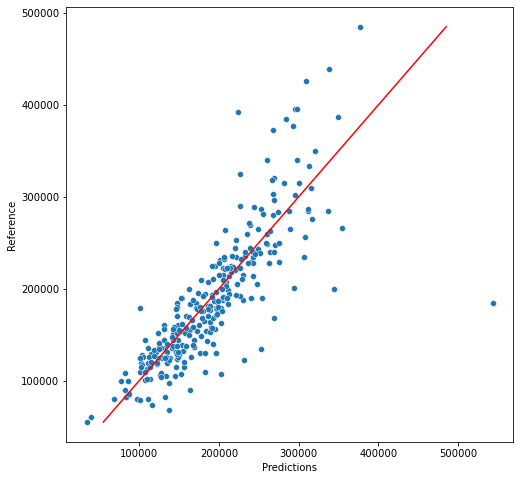

In [61]:
def plot_predictions(y_true, y_pred): 
    print(
        f"""
        MSE: {mean_squared_error(y_true, y_pred)}
        RMSE: {mean_squared_error(y_true, y_pred)**0.5}
        MAE: {mean_absolute_error(y_true, y_pred)}
        """
    )
    max_preds = min([max(y_pred.tolist()), max(y_true.tolist())])
    min_preds = max([min(y_pred.tolist()), min(y_true.tolist())])
    print(max_preds, min_preds)
    plt.figure(figsize=(8,8))
    sns.scatterplot(x=y_pred, y=y_true)
    sns.lineplot(x=[min_preds,max_preds], y=[min_preds, max_preds], color='red')
    plt.ylabel('Reference')
    plt.xlabel('Predictions')
    plt.show()

plot_predictions(y_test, results['predictions'])

In [ ]:
error distribrution

In [62]:
error_distribution =results.assign(error = lambda x: x['predictions'] - x['true_values'])
error_distribution

,predictions,true_values,error
1260,186946.869488,181000,5946.869488
274,101563.007021,124500,-22936.992979
51,156544.086228,114500,42044.086228
117,163358.273365,155000,8358.273365
789,230125.245992,187500,42625.245992
...,...,...,...
801,182002.609288,109900,72102.609288
1292,201965.644928,107500,94465.644928
197,306427.497750,235000,71427.497750
780,177740.170195,176000,1740.170195


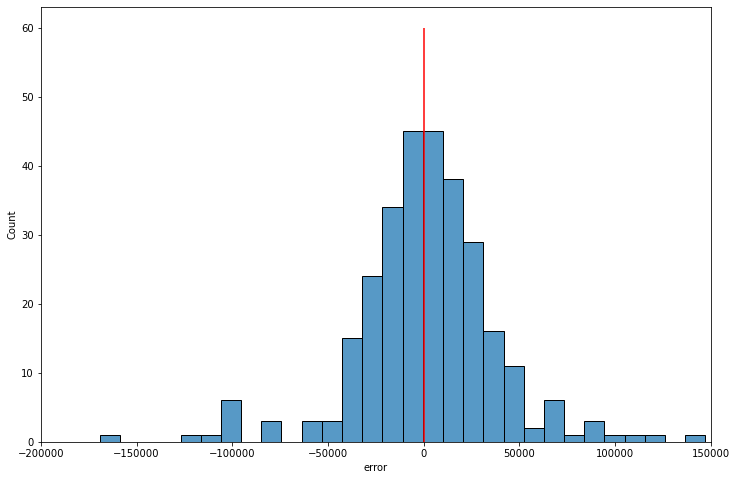

In [63]:

plt.subplots(figsize=(12, 8))
sns.histplot(error_distribution['error'])
plt.vlines(x=0, ymin=0, ymax=60, color='red')
plt.xlim(-200000, 150000)
plt.show()

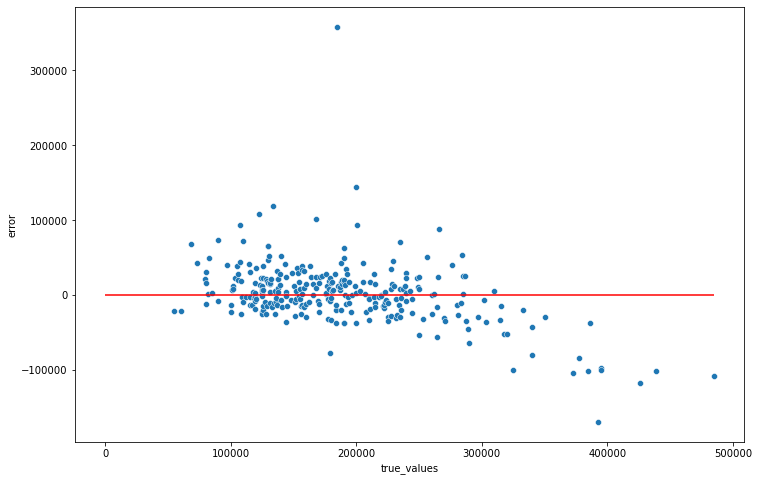

In [64]:
err_distr = error_distribution.sort_values(by='true_values')

plt.subplots(figsize=(12, 8))
sns.scatterplot(data=err_distr, x='true_values', y='error')
plt.hlines(y=0, xmin=0, xmax=max(error_distribution['true_values']), color='red')
plt.show()

pipeline

In [66]:
numeric_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='median')),
    ('scale', MinMaxScaler())])

categorical_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('ordinal',OrdinalEncoder())
])

In [69]:
num_col= list(X_train.select_dtypes(include=['int64','float64']))

In [70]:
cat_col=list(X_train.select_dtypes(include=['object']))

In [71]:
full_processor = ColumnTransformer(transformers=[
    ('number', numeric_pipeline, num_col), 
    ('category', categorical_pipeline, cat_col)
])

lm_pipeline = Pipeline(steps=[
    ('processor', full_processor), 
    ('model', LinearRegression())
])

_ = lm_pipeline.fit(X_train, y_train)

In [72]:
lm_pipeline

Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('number',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scale',
                                                                   MinMaxScaler())]),
                                                  ['Id', 'MSSubClass',
                                                   'LotFrontage', 'LotArea',
                                                   'OverallQual', 'OverallCond',
                                                   'YearBuilt', 'YearRemodAdd',
                                                   'MasVnrArea', 'BsmtFinSF1',
                                                   'BsmtFinSF2', 'BsmtUnfSF',
                                                   'TotalBsmtSF', '1stFlrSF',
                         


        MSE: 835238225.6874232
        RMSE: 28900.48832956674
        MAE: 18453.905594416796
        
691905.113869863 34900


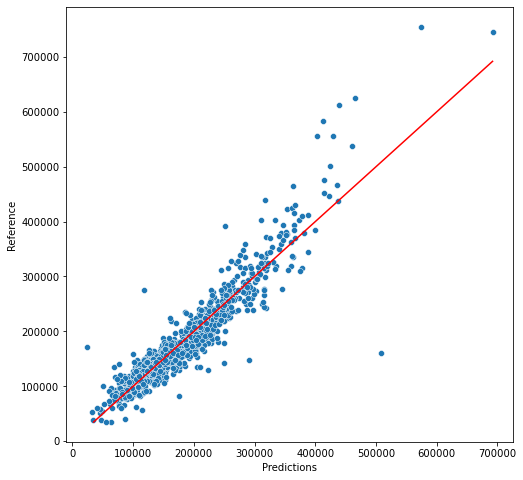

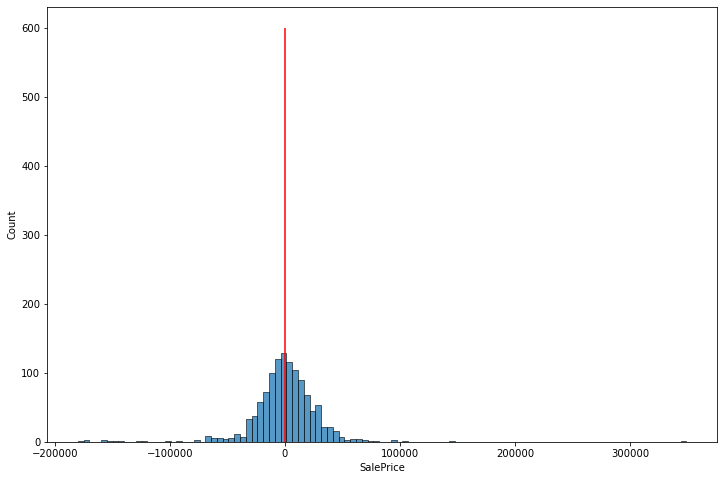

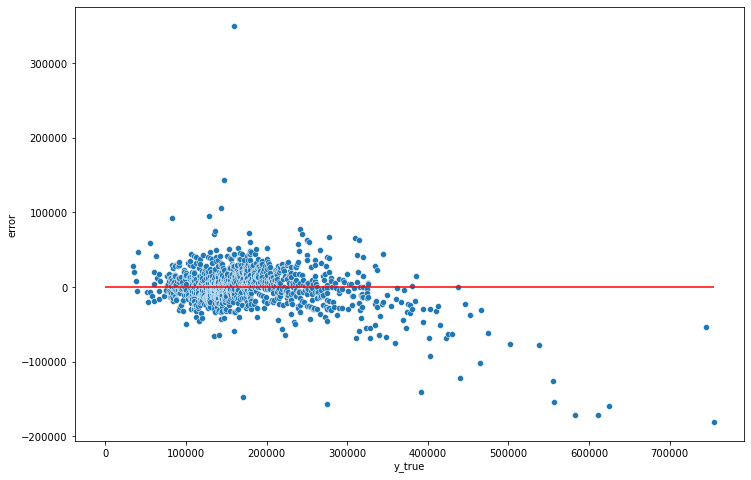

In [73]:
def plot_predictions(y_true, y_pred): 
    print(
        f"""
        MSE: {mean_squared_error(y_true, y_pred)}
        RMSE: {mean_squared_error(y_true, y_pred)**0.5}
        MAE: {mean_absolute_error(y_true, y_pred)}
        """
    )
    max_preds = min([max(y_pred.tolist()), max(y_true.tolist())])
    min_preds = max([min(y_pred.tolist()), min(y_true.tolist())])
    print(max_preds, min_preds)
    plt.figure(figsize=(8,8))
    sns.scatterplot(x=y_pred, y=y_true)
    sns.lineplot(x=[min_preds,max_preds], y=[min_preds, max_preds], color='red')
    plt.ylabel('Reference')
    plt.xlabel('Predictions')
    plt.show()
    
    errors = y_pred - y_true
    plt.subplots(figsize=(12, 8))
    sns.histplot(errors)
    plt.vlines(x=0, ymin=0, ymax=600, color='red')
    plt.show()

    p_df = (
        pd.DataFrame({'y_true':y_true, 'y_pred':y_pred})
        .assign(error = lambda x: x['y_pred'] - x['y_true'])
        .sort_values(by='y_true')
        )

    plt.subplots(figsize=(12, 8))
    sns.scatterplot(data=p_df, x='y_true', y='error')
    plt.hlines(y=0, xmin=0, xmax=max(p_df['y_true']), color='red')
    plt.show()

    
    
   
    
plot_predictions(y_train, lm_pipeline.predict(X_train))

In [ ]:
Pearson coeficient

In [75]:
def corr_coeff(df, var1, var2): 
    temp = df.copy()
    temp['corrn'] = (
        (temp[var1] - np.mean(temp[var1])) * 
        (temp[var2] - np.mean(temp[var2]))
    )
    temp['corr1'] = (temp[var1] - np.mean(temp[var1]))**2
    temp['corr2'] = (temp[var2] - np.mean(temp[var2]))**2
    corrn = sum(temp['corrn'])/np.sqrt(sum(temp['corr1']) * sum(temp['corr2']))
    return corrn

In [76]:
corr_coeff(X_train, "GarageCars",'GrLivArea')

0.46732237422934797

In [77]:
corr_coeff(X_train, "GarageCars",'TotalBsmtSF')

0.4373135033568028

In [78]:
corr_coeff(X_train, "GarageCars",'OverallCond')

-0.17671636601665264

In [79]:
corr_coeff(X_train, "GrLivArea",'OverallCond')

-0.059430929587921365

In [80]:
corr_coeff(X_train, "TotalBsmtSF",'OverallCond')

-0.17196925625389695

In [82]:
corr_coeff(X_train, "TotalBsmtSF",'GrLivArea')

0.46449918444823013

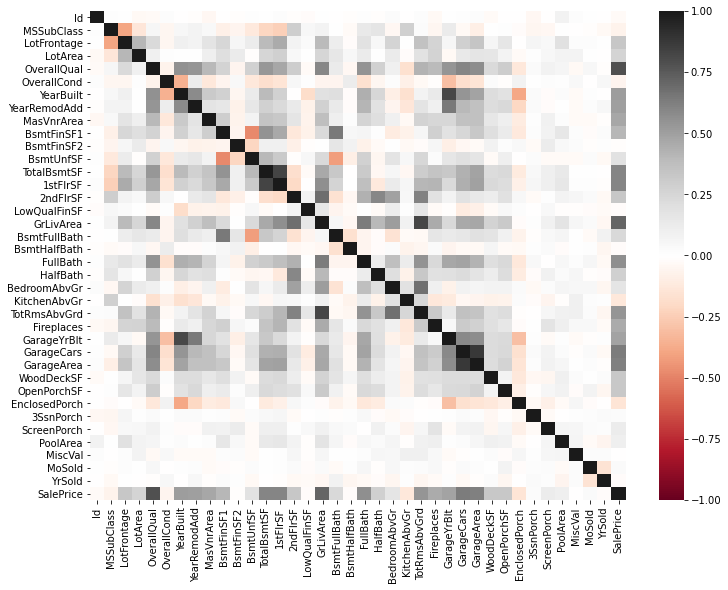

In [83]:
train = pd.concat([X_train, y_train], axis=1)
plt.subplots(figsize=(12, 9))
sns.heatmap(train.corr(), vmin=-1, vmax=1, cmap='RdGy')
plt.show()

In [88]:
X_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

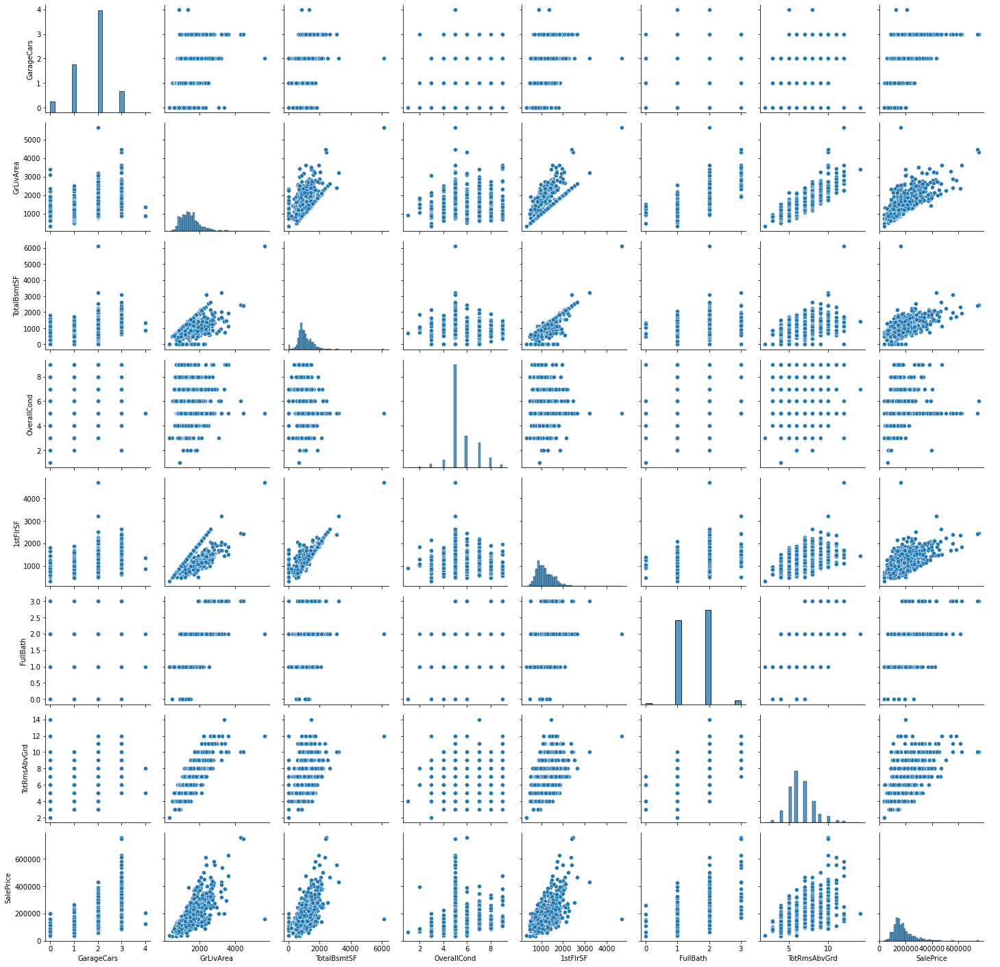

In [90]:
g = sns.PairGrid(train[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond','1stFlrSF','FullBath','TotRmsAbvGrd','SalePrice']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

In [92]:
X_train[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond','1stFlrSF','FullBath','TotRmsAbvGrd']]

,GarageCars,GrLivArea,TotalBsmtSF,OverallCond,1stFlrSF,FullBath,TotRmsAbvGrd
884,1,892,892,5,892,1,5
641,2,1929,1057,5,1057,2,7
1357,2,1078,1078,6,1078,1,6
469,2,1710,832,5,832,2,7
222,2,1552,713,6,811,2,6
...,...,...,...,...,...,...,...
986,1,1635,485,8,1001,1,5
133,2,1296,1267,5,1296,2,6
361,1,1505,883,5,988,1,8
1364,2,1200,600,5,520,2,4


trying linear regression with more features


        MSE: 1989819983.2149785
        RMSE: 44607.39830134659
        MAE: 28566.808528778005
        
714421.7322822408 34900


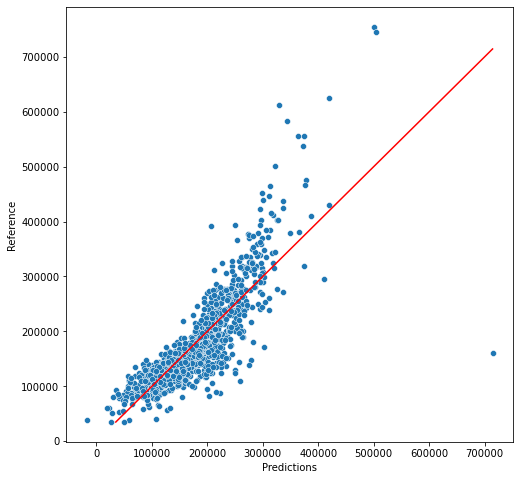

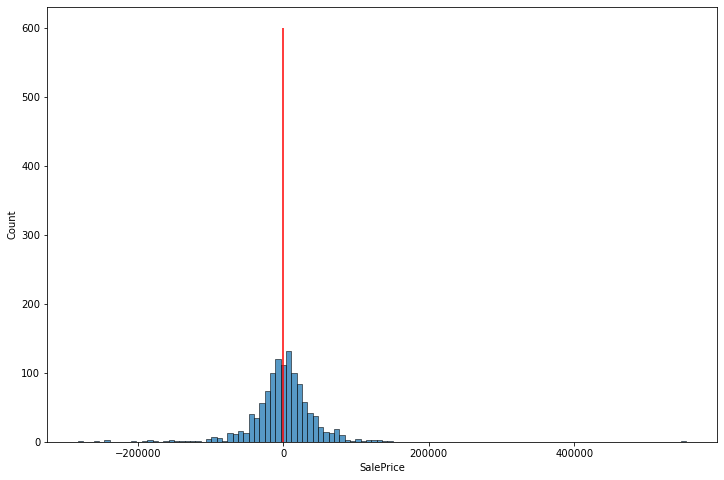

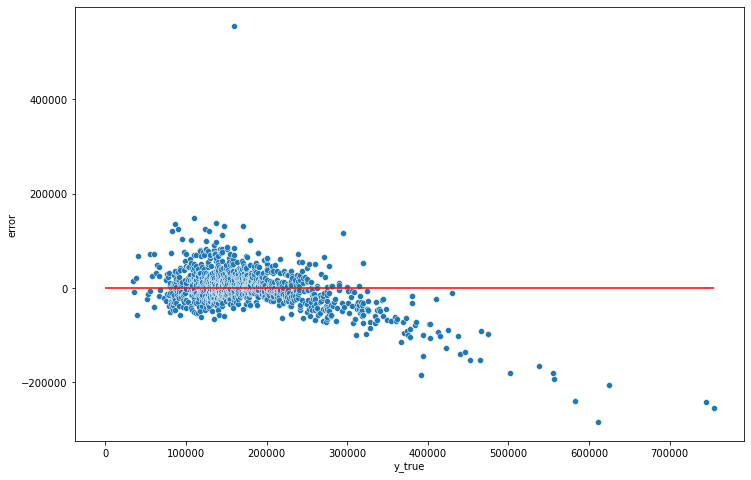

In [93]:
lm.fit(np.array(X_train[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond','1stFlrSF','FullBath','TotRmsAbvGrd']]), y_train)
plot_predictions(y_train, lm.predict(np.array(X_train[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond','1stFlrSF','FullBath','TotRmsAbvGrd']])))

In [94]:
results = pd.DataFrame({
    'predictions':lm.predict(np.array(X_test[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond','1stFlrSF','FullBath','TotRmsAbvGrd']])), 
    'true_values':y_test
})
results.head()


,predictions,true_values
1260,191540.358659,181000
274,100865.525188,124500
51,149635.955022,114500
117,159238.555889,155000
789,229520.873843,187500



        MSE: 1748154987.7454455
        RMSE: 41810.94339697976
        MAE: 26606.743930445482
        
485000 55000


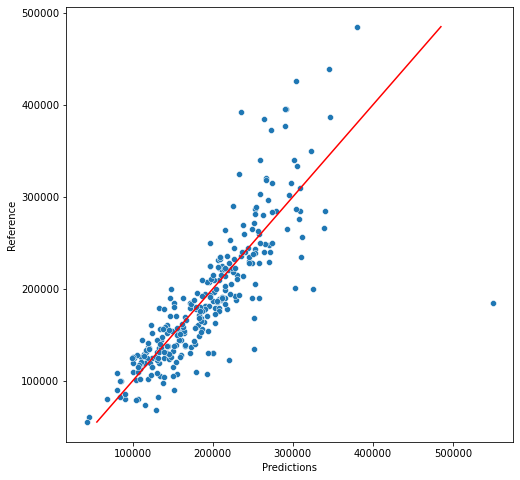

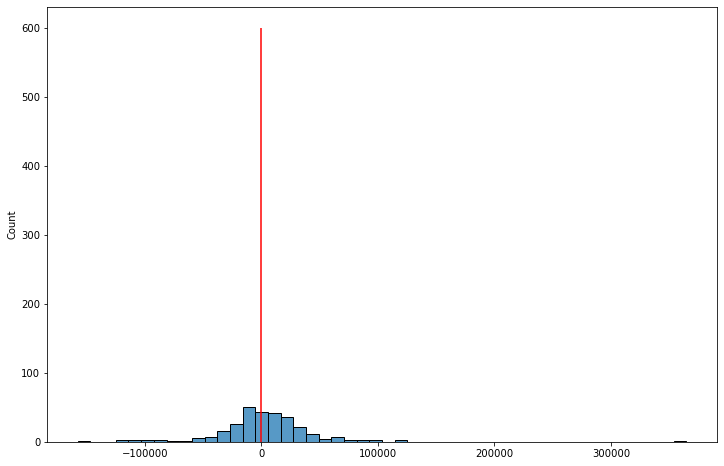

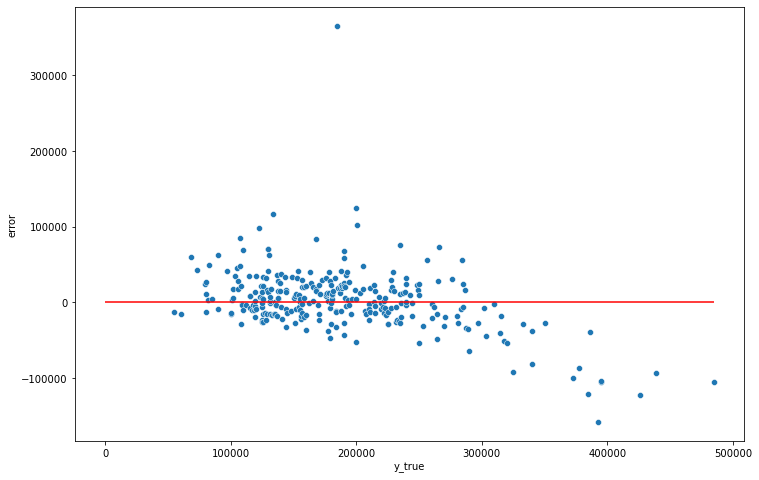

In [95]:
plot_predictions(results.true_values, results.predictions)

In [97]:
num_col = ['GarageCars','GrLivArea','TotalBsmtSF','OverallCond','1stFlrSF','FullBath','TotRmsAbvGrd']

In [98]:
numeric_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='median')),
    ('scale', MinMaxScaler())])


In [99]:
full_processor = ColumnTransformer(transformers=[
    ('number', numeric_pipeline, num_col), 
])

lm_pipeline = Pipeline(steps=[
    ('processor', full_processor), 
    ('model', LinearRegression())
])

_ = lm_pipeline.fit(X_train, y_train)

In [100]:
lm_pipeline

Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('number',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scale',
                                                                   MinMaxScaler())]),
                                                  ['GarageCars', 'GrLivArea',
                                                   'TotalBsmtSF', 'OverallCond',
                                                   '1stFlrSF', 'FullBath',
                                                   'TotRmsAbvGrd'])])),
                ('model', LinearRegression())])

In [110]:
from sklearn.metrics import r2_score
 
y_pred = lm.predict(np.array(X_test[['GarageCars','GrLivArea','TotalBsmtSF','OverallCond','1stFlrSF','FullBath','TotRmsAbvGrd']]))
 
r2 = r2_score(y_test, y_pred)
print(r2)

0.6677935347725912



        MSE: 1989819983.2149785
        RMSE: 44607.39830134659
        MAE: 28566.808528777998
        
714421.7322822405 34900


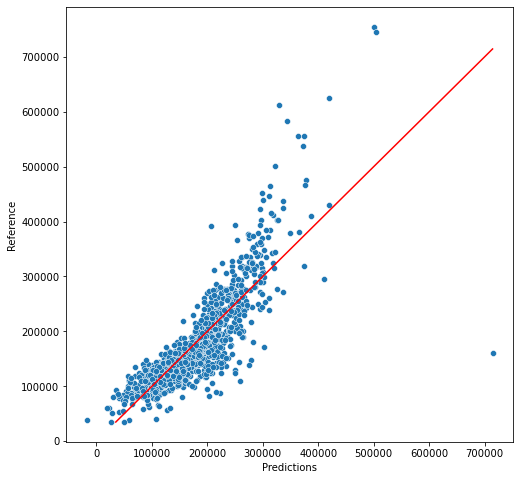

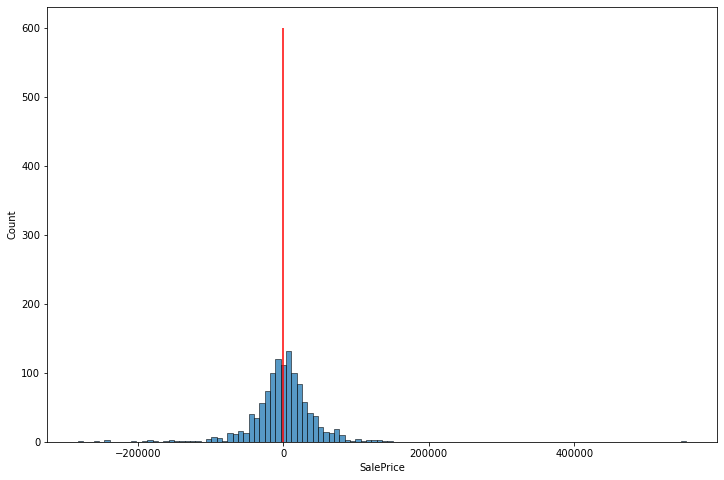

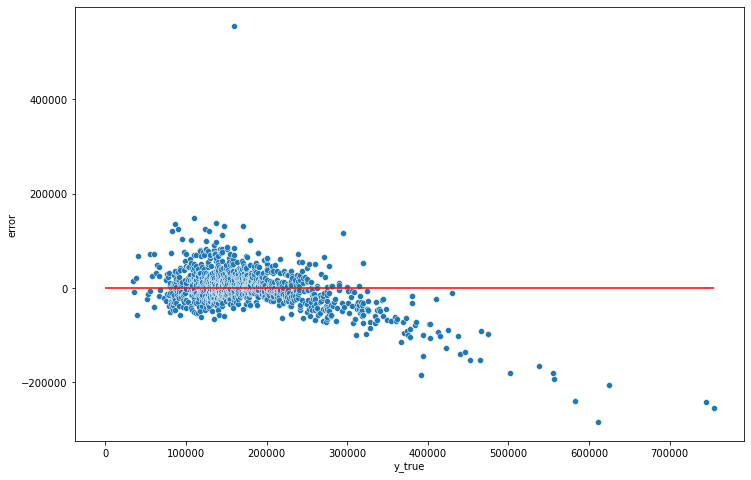

In [101]:
def plot_predictions(y_true, y_pred): 
    print(
        f"""
        MSE: {mean_squared_error(y_true, y_pred)}
        RMSE: {mean_squared_error(y_true, y_pred)**0.5}
        MAE: {mean_absolute_error(y_true, y_pred)}
        """
    )
    max_preds = min([max(y_pred.tolist()), max(y_true.tolist())])
    min_preds = max([min(y_pred.tolist()), min(y_true.tolist())])
    print(max_preds, min_preds)
    plt.figure(figsize=(8,8))
    sns.scatterplot(x=y_pred, y=y_true)
    sns.lineplot(x=[min_preds,max_preds], y=[min_preds, max_preds], color='red')
    plt.ylabel('Reference')
    plt.xlabel('Predictions')
    plt.show()
    
    errors = y_pred - y_true
    plt.subplots(figsize=(12, 8))
    sns.histplot(errors)
    plt.vlines(x=0, ymin=0, ymax=600, color='red')
    plt.show()

    p_df = (
        pd.DataFrame({'y_true':y_true, 'y_pred':y_pred})
        .assign(error = lambda x: x['y_pred'] - x['y_true'])
        .sort_values(by='y_true')
        )

    plt.subplots(figsize=(12, 8))
    sns.scatterplot(data=p_df, x='y_true', y='error')
    plt.hlines(y=0, xmin=0, xmax=max(p_df['y_true']), color='red')
    plt.show()

    
    
   
    
plot_predictions(y_train, lm_pipeline.predict(X_train))

In [119]:
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import TruncatedSVD
from scipy import sparse as sp

In [123]:
svd = TruncatedSVD(n_components=80)
num_col= list(X_train.select_dtypes(include=['int64','float64']))
cat_col=list(X_train.select_dtypes(include=['object']))

In [131]:
svd_pipeline = Pipeline(steps=[
    ('svd', TruncatedSVD(n_components=80))
])
numeric_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='median')),
    ('scale', MinMaxScaler())])

categorical_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('ordinal',OneHotEncoder())
])
full_processor = ColumnTransformer(transformers=[
    ('number', numeric_pipeline, num_col), 
    ('category', categorical_pipeline, cat_col)
])

lm_pipeline_svd = Pipeline(steps=[
    ('processor', full_processor), 
    ('svd', svd_pipeline),
    ('model', LinearRegression())
])

_ = lm_pipeline_svd.fit(X_train, y_train)

In [132]:
lm_pipeline_svd

Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('number',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scale',
                                                                   MinMaxScaler())]),
                                                  ['Id', 'MSSubClass',
                                                   'LotFrontage', 'LotArea',
                                                   'OverallQual', 'OverallCond',
                                                   'YearBuilt', 'YearRemodAdd',
                                                   'MasVnrArea', 'BsmtFinSF1',
                                                   'BsmtFinSF2', 'BsmtUnfSF',
                                                   'TotalBsmtSF', '1stFlrSF',
                         

In [133]:
def plot_predictions(y_true, y_pred): 
    print(
        f"""
        MSE: {mean_squared_error(y_true, y_pred)}
        RMSE: {mean_squared_error(y_true, y_pred)**0.5}
        MAE: {mean_absolute_error(y_true, y_pred)}
        """
    )
    max_preds = min([max(y_pred.tolist()), max(y_true.tolist())])
    min_preds = max([min(y_pred.tolist()), min(y_true.tolist())])
    print(max_preds, min_preds)
    plt.figure(figsize=(8,8))
    sns.scatterplot(x=y_pred, y=y_true)
    sns.lineplot(x=[min_preds,max_preds], y=[min_preds, max_preds], color='red')
    plt.ylabel('Reference')
    plt.xlabel('Predictions')
    plt.show()
    
    errors = y_pred - y_true
    plt.subplots(figsize=(12, 8))
    sns.histplot(errors)
    plt.vlines(x=0, ymin=0, ymax=600, color='red')
    plt.show()

    p_df = (
        pd.DataFrame({'y_true':y_true, 'y_pred':y_pred})
        .assign(error = lambda x: x['y_pred'] - x['y_true'])
        .sort_values(by='y_true')
        )

    plt.subplots(figsize=(12, 8))
    sns.scatterplot(data=p_df, x='y_true', y='error')
    plt.hlines(y=0, xmin=0, xmax=max(p_df['y_true']), color='red')
    plt.show()

    
    


        MSE: 982458106.6712266
        RMSE: 31344.18776537728
        MAE: 19714.987378679096
        
497104.7969791817 34900


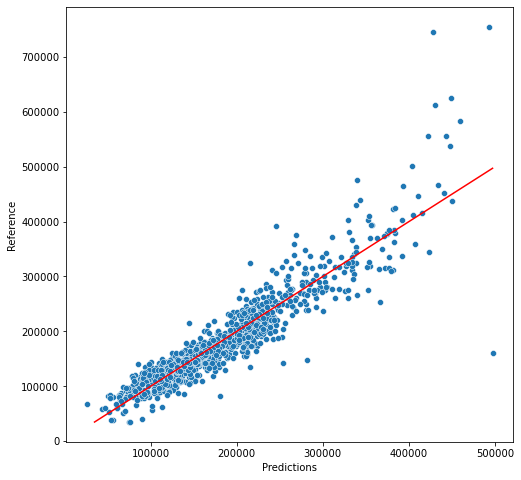

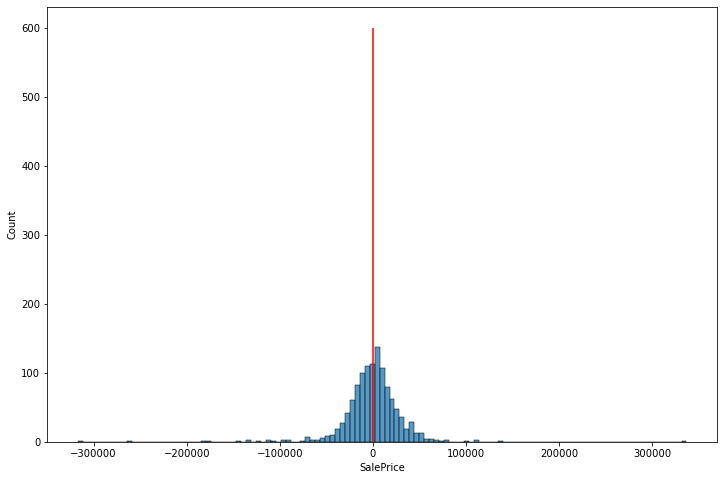

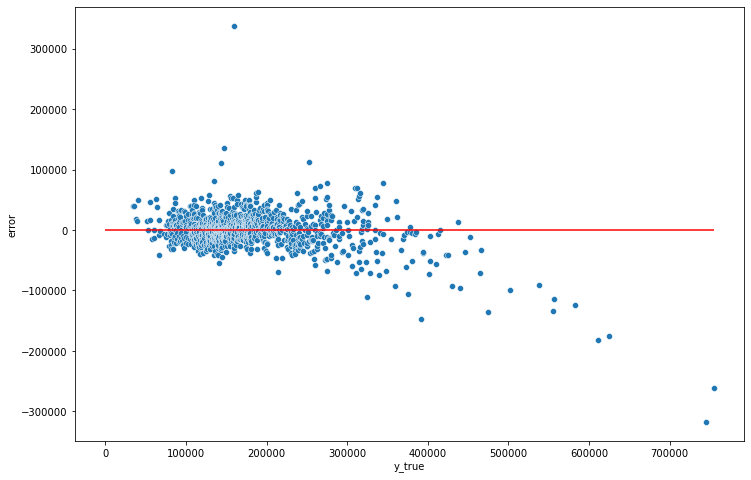

In [134]:
    
plot_predictions(y_train, lm_pipeline_svd.predict(X_train))